# Exploratory Analysis of the Data

> Written by Marta Galván

In [1]:
import pandas as pd
import pandas as pd
import numpy as np
import statistics as stats
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import scipy.stats as ss
import statistics as stats
import seaborn as sns 
from pandas.plotting import autocorrelation_plot

## Visualization of the data

We upload the csv first of all, eliminating the columns **'Unnamed: 0'** and **estatus_glucemico**, since they are the ones used for defying the feature variable. Later we print the total shape of the the csv and the names of the final columns present in the data.

In [2]:
data = pd.read_csv("pacientes_progresores_2021.csv")
patient_data= data.drop(['Unnamed: 0','estatus_glucemico_inicio','estatus_glucemico_final'], axis=1) 
print(patient_data.shape)

(2016, 24)


In [3]:
patient_data.columns
columns = list(patient_data.columns)
#columns


In [4]:
patient_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2016 entries, 0 to 2015
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   sexo              2016 non-null   object 
 1   edad              2016 non-null   int64  
 2   peso              2016 non-null   float64
 3   talla             2016 non-null   int64  
 4   IMC               2016 non-null   float64
 5   TAS               2016 non-null   int64  
 6   TAD               2016 non-null   int64  
 7   LDL               1983 non-null   float64
 8   HDL               1993 non-null   float64
 9   trigl             2012 non-null   float64
 10  Hbglic            1725 non-null   float64
 11  albuminuria       1925 non-null   float64
 12  creat             2016 non-null   float64
 13  cist              2016 non-null   float64
 14  PCR               2016 non-null   float64
 15  Epi.creat         2016 non-null   float64
 16  Epi.cist          2016 non-null   float64


In [5]:
patient_data

,sexo,edad,peso,talla,IMC,TAS,TAD,LDL,HDL,trigl,...,PCR,Epi.creat,Epi.cist,diabetes,evento.cv,mortalidad,num_farmacos,hemoglobina_glic,glucemia,progresores
0,V,64,101.0,168,35.7,136,79,161.0,81.0,202.0,...,3.45,77.912391,104.784197,NO,0,0,3,5.3,96.0,progresor_prediab
1,V,50,94.0,167,33.7,138,86,134.0,57.0,161.0,...,13.10,63.621400,56.543903,NO,0,0,2,NaN,92.0,sano_no_progresor
2,M,59,96.0,157,38.9,147,68,81.0,97.0,109.0,...,3.44,94.835852,99.735909,NO,0,0,2,5.9,100.0,mejoria
3,M,47,75.0,150,33.3,141,84,199.0,78.0,612.0,...,5.50,119.731190,126.125489,NO,0,0,4,6.0,104.0,prediab_no_progresor
4,V,62,87.0,176,28.0,123,81,152.0,41.0,301.0,...,10.70,60.331459,98.543859,SI,0,0,1,6.5,156.0,diabetico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,V,58,80.0,165,29.3,155,78,160.0,56.0,158.0,...,4.04,98.468928,112.675956,SI,0,0,4,8.6,204.0,diabetico
2012,M,70,75.0,155,31.2,145,72,100.0,48.0,170.0,...,6.60,93.386421,100.803927,SI,0,0,2,6.2,102.0,progresor_diab
2013,M,67,61.0,154,25.7,160,81,143.0,67.0,114.0,...,11.60,97.651100,110.267435,NO,0,0,3,5.5,91.0,sano_no_progresor
2014,V,53,114.0,169,39.9,138,88,138.0,72.0,249.0,...,5.81,84.171448,139.918535,NO,0,0,2,6.0,111.0,mejoria


## Treatment of cathegorical values.

In the case of 'diabetes' and 'sexo' we have categorical alues that need to be transformed into numbers in order to properly train the model.

In [6]:
patient_data['sexo'] = patient_data['sexo'].astype('category').cat.codes # 0 --> Mujer, 1--> Varón
patient_data['diabetes'] = patient_data['diabetes'].astype('category').cat.codes # 0 --> NO, 1--> SI

In [7]:
#patient_data

## Maximum and minimum identification

In order to see theminimum and the maximum of each variable, we use the .describe() command. 

In [8]:
patient_data.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
sexo,2016,NaN,NaN,NaN,0.493056,0.500076,0,0,0,1,1
edad,2016,NaN,NaN,NaN,56.0223,13.9768,14,48,57,65,90
peso,2016,NaN,NaN,NaN,83.0075,16.8202,45,71,81,92,166
talla,2016,NaN,NaN,NaN,162.736,10.1879,136,155,162,170,195
IMC,2016,NaN,NaN,NaN,31.2646,5.5864,16.8,27.5,30.4,34,59.2
TAS,2016,NaN,NaN,NaN,141.325,13.8755,104,132,141,149,246
TAD,2016,NaN,NaN,NaN,79.7822,9.03853,53,74,80,85,124
LDL,1983,NaN,NaN,NaN,132.923,32.6768,42,111,132,153,276
HDL,1993,NaN,NaN,NaN,63.575,17.4339,6,51,61,73,168
trigl,2012,NaN,NaN,NaN,178.102,120.43,26,108.75,147.5,208,1600


In [9]:
patient_data.describe()['edad'][['min','max']]


min    14.0
max    90.0
Name: edad, dtype: float64

A list with maximum and minimum values was created, using the columns with the numeric values (the non-numeric values were deleted). Every variable's maximum, minimum and data is associated to an element in the list. 

In [10]:
max_min_list=[]
for el in columns:
    try:
        max_min_list.append(patient_data.describe()[el][['min','max']])
    except:
        print('Para evitar el problema con progresores')

Para evitar el problema con progresores


In [11]:
max_min_list[1]


min    14.0
max    90.0
Name: edad, dtype: float64

## Outliers identification using boxplots. 

An outlier is an observation that lies an abnormal distance from other values in a random sample from a population. Boxplot will be used in order to identify them. 

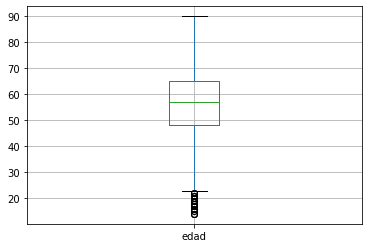

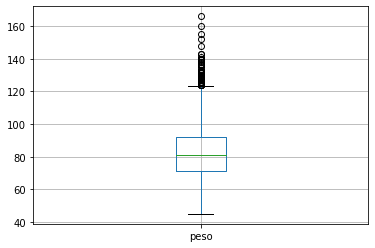

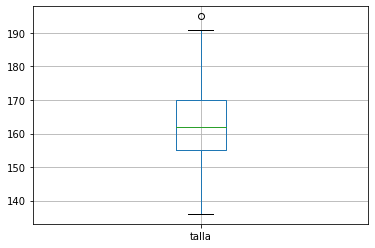

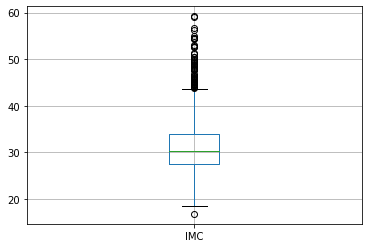

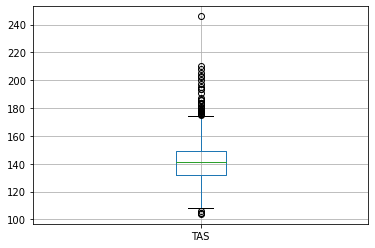

...

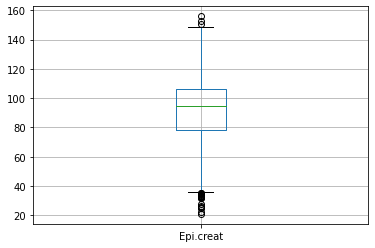

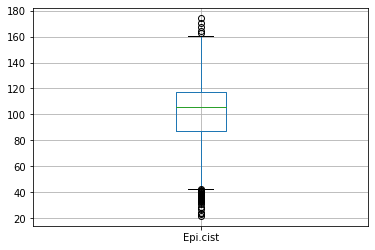

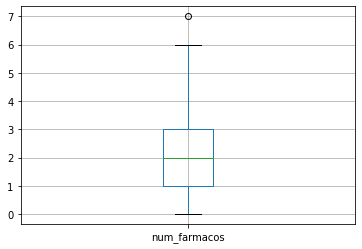

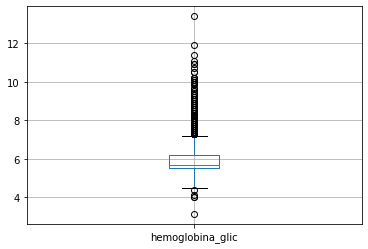

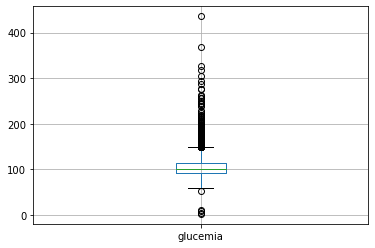

In [12]:

for i in columns:
    if i == 'mortalidad' or i=='evento.cv' or i=='sexo' or i=='diabetes' or i=='progresores': #eliminamos los dos boxplots de las variabes binarias
        continue
    else:
        patient_data.boxplot(column=i)
        plt.show()
    

The binary variables are: 'evento.cv' and 'mortalidad'. This values only give 0 or 1.

* The maximum and minimum for **age** given by the data are **[90,14]**. According to the boxplot, the maximum would be the same, but the minimum should be around 22. Any number below is an outliner. 

* The maximum and minimum for **weight** given by the data are **[166,45]**. According to the boxplot, the maximum would be 121, and the minimum should be around 45,as well. Any number outside the values is an outliner. 

* The maximum and minimum for **size** given by the data are **[195,136]**. According to the boxplot, the maximum would be 191, and the minimum should be around 136,as well. Any number outside the values is an outliner.

* The maximum and minimum for **IMC** given by the data are **[59.2,16.8]**. According to the boxplot, the maximum would be 43, and the minimum should be around 16.8,as well. Any number outside the values is an outliner.

* The maximum and minimum for **TAS** given by the data are **[246,104]**. According to the boxplot, the maximum would be around 175, and the minimum should be around 110. Any number outside the values is an outliner.

* The maximum and minimum for **TAD** given by the data are **[124,53]**. According to the boxplot, the maximum would be around 102, and the minimum should be around 58. Any number outside the values is an outliner.

* The maximum and minimum for **LDL** given by the data are **[276,42]**. According to the boxplot, the maximum would be around 220, and the minimum should be around 50. Any number outside the values is an outliner.

* The maximum and minimum for **HDL** given by the data are **[168,6]**. According to the boxplot, the maximum would be around 107, and the minimum should be around 20. Any number outside the values is an outliner.

* The maximum and minimum for **triglicerides** given by the data are **[1600,26]**. According to the boxplot, the maximum would be around 380, and the minimum should be around 26. Any number outside the values is an outliner.

* The maximum and minimum for **Hbglic** given by the data are **[13.4,4]**. According to the boxplot, the maximum would be around 7.8, and the minimum should be around 4.5. Any number outside the values is an outliner.

* The maximum and minimum for **albuminuria** given by the data are **[3037,0]**. According to the boxplot, the maximum would be around 110, and the minimum should be around 0. Any number outside the values is an outliner.

* The maximum and minimum for **creat** given by the data are **[2.3,0.3]**. According to the boxplot, the maximum would be around 0.4, and the minimum should be around 1.23. Any number outside the values is an outliner.

* The maximum and minimum for **cist** given by the data are **[2.4,0.3]**. According to the boxplot, the maximum would be around 0.6, and the minimum should be around 1.25. Any number outside the values is an outliner.

* The maximum and minimum for **PCR** given by the data are **[344,0.8]**. According to the boxplot, the maximum would be around 25, and the minimum should be around 0.8. Any number outside the values is an outliner.

* The maximum and minimum for **EPI.creat** given by the data are **[155.99,20.93]**. According to the boxplot, the maximum would be around 150, and the minimum should be around 38. Any number outside the values is an outliner.

* The maximum and minimum for **EPI.cist** given by the data are **[174.18,21.65]**. According to the boxplot, the maximum would be around 160, and the minimum should be around 41. Any number outside the values is an outliner.

* The maximum and minimum for **EPI.cist** given by the data are **[174.18,21.65]**. According to the boxplot, the maximum would be around 160, and the minimum should be around 41. Any number outside the values is an outliner.

* In the case of **evento.cv**, **mortalidad**, **diabetes** and **sexo** the boxplots are not useful, since the value can be either 1 or 0.

* The maximum and minimum for **num_farmacos** given by the data are **[7,0]**. According to the boxplot, the maximum would be around 6, and the minimum should be around 0. Any number outside the values is an outliner.

* The maximum and minimum for **hemoglobina_glic** given by the data are **[13.4,3.13]**. According to the boxplot, the maximum would be around 7.2, and the minimum should be around 5. Any number outside the values is an outliner.

* The maximum and minimum for **glucemia** given by the data are **[436,2]**. According to the boxplot, the maximum would be around 150, and the minimum should be around 50. Any number outside the values is an outliner.

## Comparison of Hbglic and hemoglobina_glic

I will represent both in order to see the distribution of the different values through the csv.

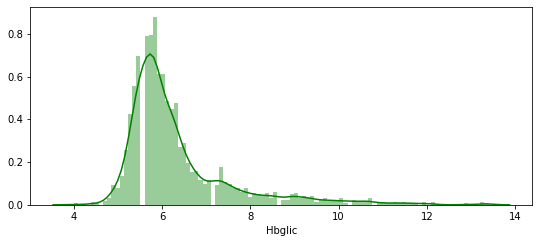

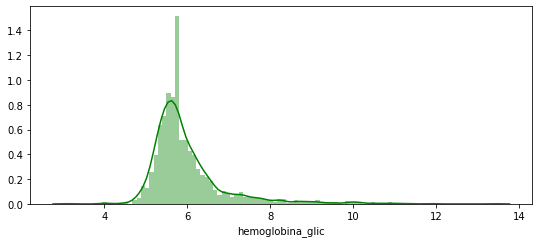

In [13]:
#print(patient_data['Hbglic'].describe())

plt.figure(figsize=(9, 8))
plt.subplot(2, 1, 1)
sns.distplot(patient_data['Hbglic'], color='g', bins=100, hist_kws={'alpha': 0.4});

#print(patient_data['hemoglobina_glic'].describe())

plt.figure(figsize=(9, 8))
plt.subplot(2, 1, 2)
sns.distplot(patient_data['hemoglobina_glic'], color='g', bins=100, hist_kws={'alpha': 0.4});

Distribution already appears to be different for each value. Let's check the values for each patient.

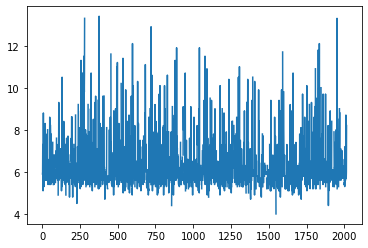

In [14]:
plt.plot(patient_data['Hbglic'])

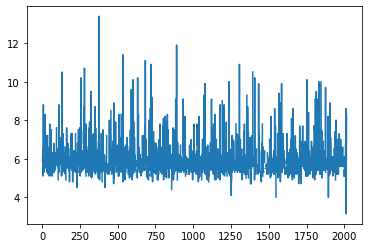

In [15]:
plt.plot(patient_data['hemoglobina_glic'])

It appears to be different in each patient. is was corroborated after a talk with the doctor. They are both considered the same. We will first do everything deleting 'Hbglic'.

In [16]:
del patient_data['Hbglic']
del patient_data['hemoglobina_glic']


## Variables to remove

Since hemogloine_glic and diabtes directly affect in the outcome, they need to be taken out, as well as HBglic. It is still in doubt if glucemia needs to be taken out as well. 

In [17]:
#remove diabetes
patient_data = patient_data.drop(['diabetes','glucemia'],axis = 1)

## Histogram for number of drugs.

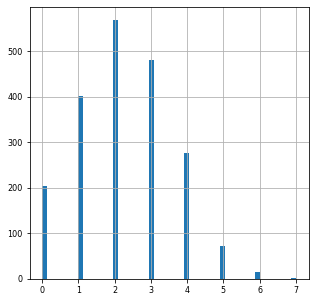

In [18]:
patient_data['num_farmacos'].hist(figsize=(5, 5), bins=50, xlabelsize=8, ylabelsize=8)

## Changing the outliers into NaN

In order to change the outlier values into **NaN** we need to apply the knowledge of the clinician that defines the values for each variable. The values obtained as. reference are obtained from a document sent by the physician. 

In [19]:
#AGE
for i in patient_data['edad']:
    if i < 20  or  i > 90:
        patient_data['edad']= patient_data['edad'].replace({i: np.nan})
        
#WEIGHT
for i in patient_data['peso']:
    if i < 50  or  i > 180:
        patient_data['peso']= patient_data['peso'].replace({i: np.nan})
        
#SIZE
for i in patient_data['talla']:  #preguntar a oscar
    if i < 120  or  i > 210:
        patient_data['talla']= patient_data['talla'].replace({i: np.nan})
        
#IMC 
for i in patient_data['IMC']:
    if i < 20  or  i > 35:
        patient_data['IMC']= patient_data['IMC'].replace({i: np.nan})
        
#TAS
for i in patient_data['TAS']:
    if i < 90  or  i > 220:
        patient_data['TAS']= patient_data['TAS'].replace({i: np.nan})
        
#TAD
for i in patient_data['TAD']:
    if i < 40  or  i > 150:
        patient_data['TAD']= patient_data['TAD'].replace({i: np.nan})
        
#LDL
for i in patient_data['LDL']:
    if i < 10  or  i > 200:
        patient_data['LDL']= patient_data['LDL'].replace({i: np.nan})
        
#HDL
for i in patient_data['HDL']:
    if i < 15  or  i > 100:
        patient_data['HDL']= patient_data['HDL'].replace({i: np.nan})

#trigl
for i in patient_data['trigl']:
    if i < 50  or  i > 750:
        patient_data['trigl']= patient_data['trigl'].replace({i: np.nan})
        
#Hbglic 
#for i in patient_data['hemoglobina_glic']:
    #if i < 2  or  i > 15:
        #patient_data['hemoglobina_glic']= patient_data['hemoglobina_glic'].replace({i: np.nan})
        
#albuminuria 
for i in patient_data['albuminuria']:
    if i < 0  or  i > 3000:
        patient_data['albuminuria']= patient_data['albuminuria'].replace({i: np.nan})

        
#creat 
for i in patient_data['creat']:
    if i < 0.3  or  i > 4:
        patient_data['creat']= patient_data['creat'].replace({i: np.nan})
        
#cist 
for i in patient_data['cist']:
    if i < 0.3  or  i > 4:
        patient_data['cist']= patient_data['cist'].replace({i: np.nan})

        
#PCR 
for i in patient_data['PCR']:
    if i < 3  or  i > 200:
        patient_data['PCR']= patient_data['PCR'].replace({i: np.nan})

#Epi.creat 
for i in patient_data['Epi.creat']:
    if i < 15  or  i > 160:
        patient_data['Epi.creat']= patient_data['Epi.creat'].replace({i: np.nan})

#Epi.cist 
for i in patient_data['Epi.cist']:
    if i < 15  or  i > 160:
        patient_data['Epi.cist']= patient_data['Epi.cist'].replace({i: np.nan})

#glucemia 
#for i in patient_data['glucemia']:
    #if i < 80  or  i > 350:
        #patient_data['glucemia']= patient_data['glucemia'].replace({i: np.nan})


#problema con hemoglobina glic y hb glic ¿es lo mismo?
#evento cv y mortalidad solo 0 y 1
#num_farmacos??



Now, the number of NaN for each variable and its percentage will be staged. In the case that thee are too many NaN values for a certain feature, the feauture will be deleted, since it won't be useful. 

In [20]:
for index,value in enumerate (patient_data.isnull().sum()):
  if value !=0:
    print('There are',value,'NaNs in',patient_data.columns[index],'and the total percentage is',((value/2016)*100),'%')

There are 17 NaNs in edad and the total percentage is 0.8432539682539683 %
There are 10 NaNs in peso and the total percentage is 0.496031746031746 %
There are 416 NaNs in IMC and the total percentage is 20.634920634920633 %
There are 1 NaNs in TAS and the total percentage is 0.0496031746031746 %
There are 84 NaNs in LDL and the total percentage is 4.166666666666666 %
There are 83 NaNs in HDL and the total percentage is 4.117063492063492 %
There are 25 NaNs in trigl and the total percentage is 1.2400793650793651 %
There are 92 NaNs in albuminuria and the total percentage is 4.563492063492063 %
There are 5 NaNs in PCR and the total percentage is 0.248015873015873 %
There are 6 NaNs in Epi.cist and the total percentage is 0.2976190476190476 %
There are 63 NaNs in progresores and the total percentage is 3.125 %


## Boxplots and histograms organized by the labels of 'progenitores'.

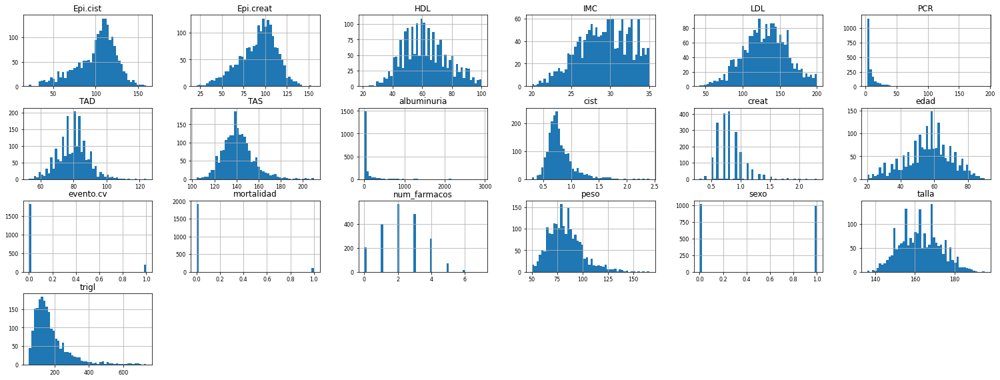

In [21]:
histograms = patient_data.hist(figsize=(26, 25), bins=50, xlabelsize=8, ylabelsize=8,layout = (10,6))

Evitar problema sexo
Evitar problema sexo
Evitar problema sexo
Evitar problema sexo
Evitar problema sexo


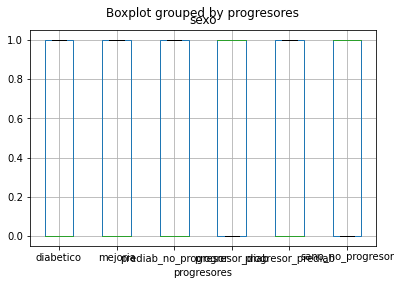

<Figure size 432x288 with 0 Axes>

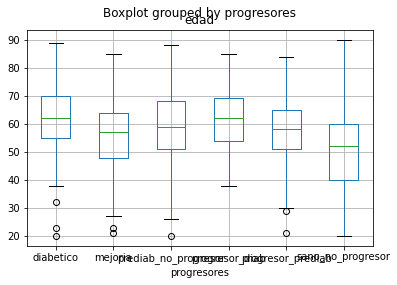

<Figure size 432x288 with 0 Axes>

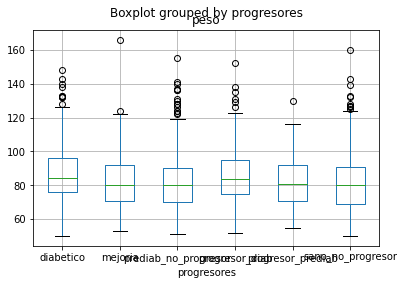

<Figure size 432x288 with 0 Axes>

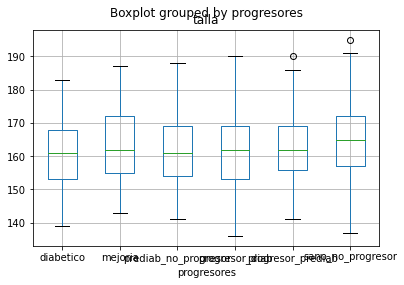

<Figure size 432x288 with 0 Axes>

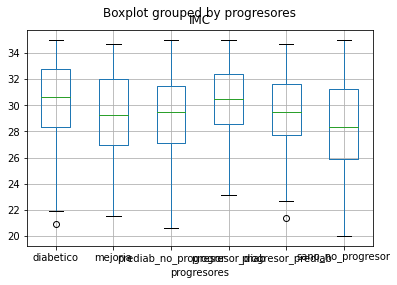

<Figure size 432x288 with 0 Axes>

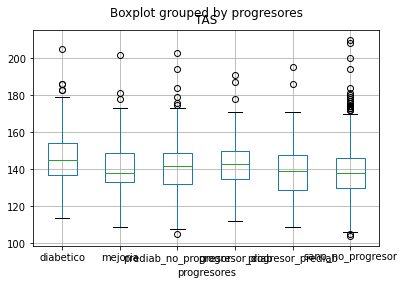

<Figure size 432x288 with 0 Axes>

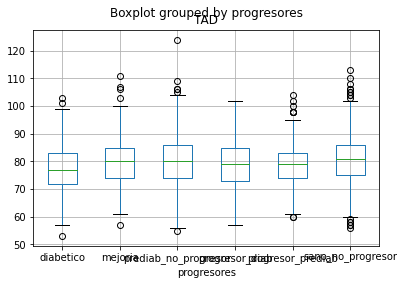

<Figure size 432x288 with 0 Axes>

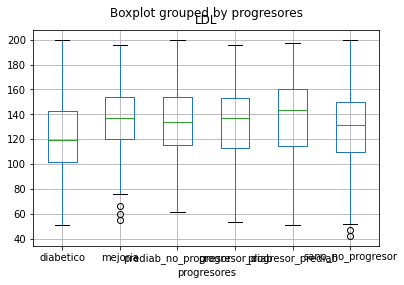

<Figure size 432x288 with 0 Axes>

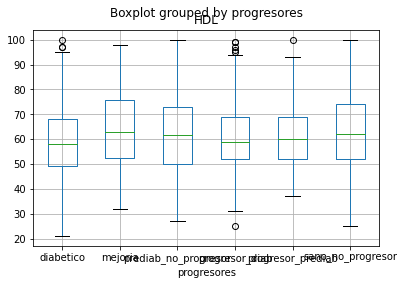

<Figure size 432x288 with 0 Axes>

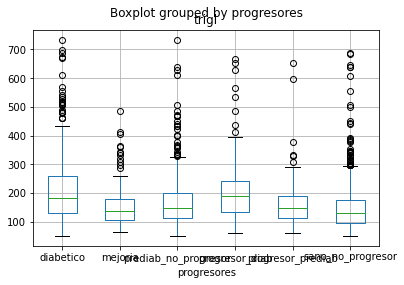

<Figure size 432x288 with 0 Axes>

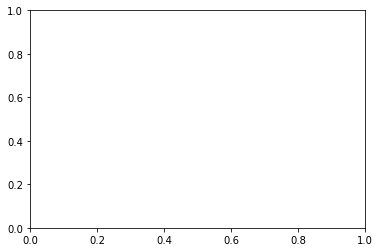

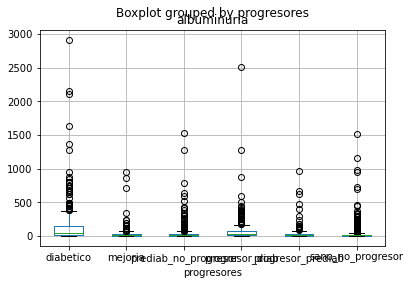

<Figure size 432x288 with 0 Axes>

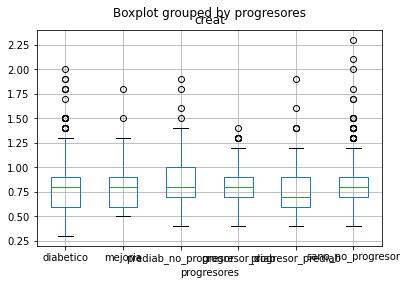

<Figure size 432x288 with 0 Axes>

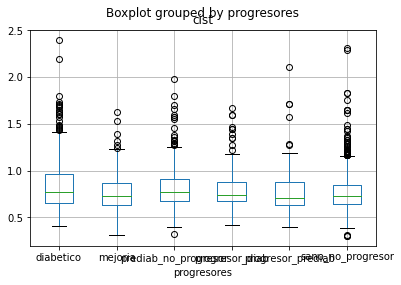

<Figure size 432x288 with 0 Axes>

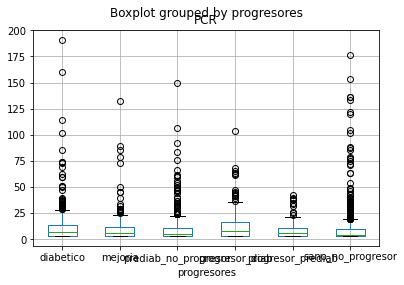

<Figure size 432x288 with 0 Axes>

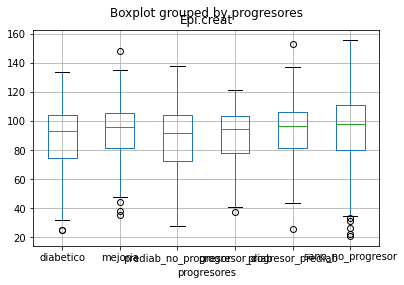

<Figure size 432x288 with 0 Axes>

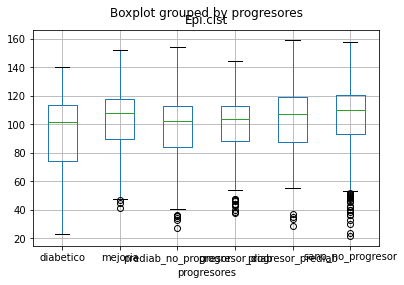

<Figure size 432x288 with 0 Axes>

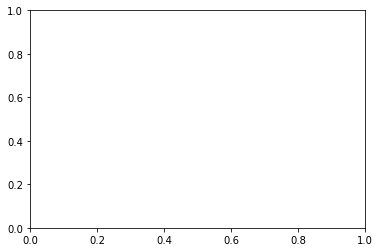

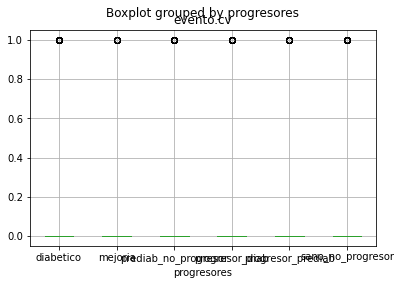

<Figure size 432x288 with 0 Axes>

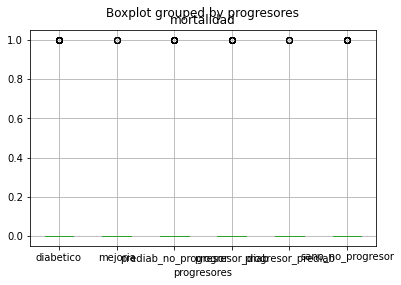

<Figure size 432x288 with 0 Axes>

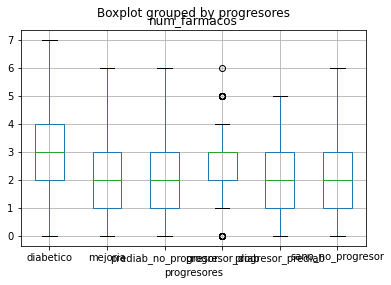

<Figure size 432x288 with 0 Axes>

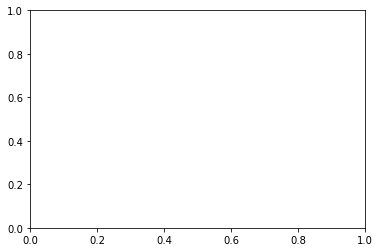

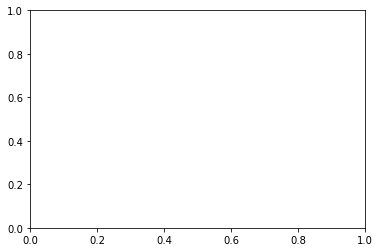

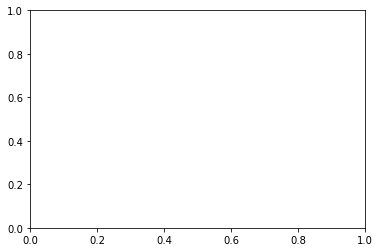

In [22]:
plt.rcParams.update({'figure.max_open_warning': 0})  ##habria que reprrasar los dos errores que da
column_name=list(columns)
for i in column_name:
    try:
        patient_data.boxplot(by='progresores',column =i)
        plt.figure()
    except:
        print('Evitar problema sexo')

## Percentage of each class of 'progresores'

In [23]:
count = patient_data['progresores'].value_counts()
print(count)

sano_no_progresor       758
diabetico               361
prediab_no_progresor    360
progresor_diab          196
mejoria                 157
progresor_prediab       121
Name: progresores, dtype: int64


In [24]:
sum(count)

1953

There must be some empty values because we are not reaching the 2016 total number of patients. The percentages are the following:

In [25]:
for el in count:
    print('The percentages are',(el/1953)*100, '%')

The percentages are 38.81208397337429 %
The percentages are 18.484383000512032 %
The percentages are 18.433179723502306 %
The percentages are 10.03584229390681 %
The percentages are 8.038914490527393 %
The percentages are 6.1955965181771635 %


In [26]:
#print('The percentages is 38.81208397337429 % for sano_no_progresor')
#print('The percentages is 18.484383000512032 % for diabetico')
#print('The percentages is 18.433179723502306 % for prediab_no_progresor')
#print('The percentages is 10.03584229390681 % for progresor_diab')
#print('The percentages is 8.038914490527393 % for mejoria')
#print('The percentages is 6.1955965181771635 % for progresor_prediab')

# Train and Test separation.

In this case, the 7 different classes are separated into 3 main ones, which are:
* **Unhealthy patients**: 
    - Patients that go from healthy to diabetic.
    - Patients that are diabetic
    - Patients that go from prediabetic to diabetic
* **Stable patients**:
    - Patients that go from healthy to prediabetic
    - Patients that stay prediabetic
* **Improved patients**: 
    - Patients that go from prediabetic to healthy
    - Patients that stay healthy

In [27]:
patient_data.progresores
print(patient_data.progresores.isnull().sum())

63


In [28]:
patient_data.progresores= patient_data.progresores.fillna('sano_progresor')

In [29]:
patient_data.loc[patient_data.progresores=='sano_no_progresor', 'progresores'] = 'improved'
patient_data.loc[patient_data.progresores=='mejoria', 'progresores'] = 'improved'

patient_data.loc[patient_data.progresores=='progresor_prediab', 'progresores'] = 'stable'
patient_data.loc[patient_data.progresores=='prediab_no_progresor', 'progresores'] = 'stable'


patient_data.loc[patient_data.progresores=='diabetico', 'progresores'] = 'unhealthy'
patient_data.loc[patient_data.progresores=='progresor_diab', 'progresores'] = 'unhealthy'
patient_data.loc[patient_data.progresores=='sano_progresor', 'progresores'] = 'unhealthy'


In [30]:
count = patient_data['progresores'].value_counts()
print(count)

improved     915
unhealthy    620
stable       481
Name: progresores, dtype: int64


In [31]:
from sklearn.model_selection import train_test_split

X = patient_data.drop(['progresores'],axis=1)
Y = patient_data.progresores

X_train, X_test,y_train, y_test = train_test_split(X, Y, test_size=0.2,random_state=4, stratify = patient_data["progresores"])

## Imputation using the median

In [32]:
X_train = X_train.fillna(X_train.median()) 


#Comprobación de que se han reemplazado todos correctamente

X_train.isnull().sum()

sexo            0
edad            0
peso            0
talla           0
IMC             0
TAS             0
TAD             0
LDL             0
HDL             0
trigl           0
albuminuria     0
creat           0
cist            0
PCR             0
Epi.creat       0
Epi.cist        0
evento.cv       0
mortalidad      0
num_farmacos    0
dtype: int64

In [33]:
X_test = X_test.fillna(X_train.median()) 


#Comprobación de que se han reemplazado todos correctamente

X_test.isnull().sum()



sexo            0
edad            0
peso            0
talla           0
IMC             0
TAS             0
TAD             0
LDL             0
HDL             0
trigl           0
albuminuria     0
creat           0
cist            0
PCR             0
Epi.creat       0
Epi.cist        0
evento.cv       0
mortalidad      0
num_farmacos    0
dtype: int64

## Dendogram and correlation between variables.

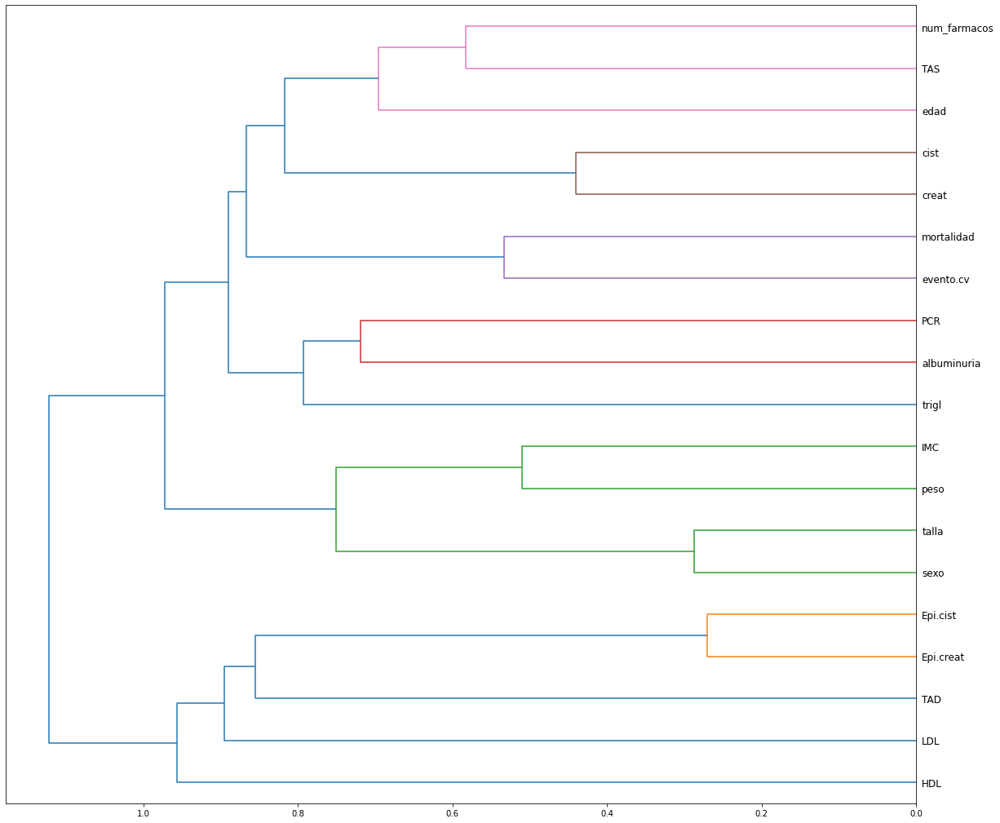

In [34]:
import scipy 
from scipy.cluster import hierarchy as hc
corr = np.round(scipy.stats.spearmanr(X_train).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(20,18))
dendrogram = hc.dendrogram(z, labels=list(X_train.columns), 
      orientation='left', leaf_font_size=12)
#plt.tight_layout()

## Decision tree

In [35]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metr
from six import StringIO

In [36]:
from sklearn import tree

#print(X_train.columns)

my_model_1 = tree.DecisionTreeClassifier(random_state=1)
my_model_2 = tree.DecisionTreeClassifier(random_state=1,max_depth = 10)

my_tree=my_model_1.fit(X_train, y_train)
my_tree_2 = my_model_2.fit(X_train,y_train)

y_pred_1 = my_tree.predict(X_test)
y_pred_2 = my_tree_2.predict(X_test)

# Model Accuracy, how often is the classifier correct?

print("Accuracy tree 1:",metrics.accuracy_score(y_test, y_pred_1))
print("Accuracy tree 2:",metrics.accuracy_score(y_test, y_pred_2))

Accuracy tree 1: 0.4381188118811881
Accuracy tree 2: 0.4752475247524752


In [37]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(my_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['improved','stable','unhealthy'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#graph.write_png('diabetes.png')
Image(graph.create_png())

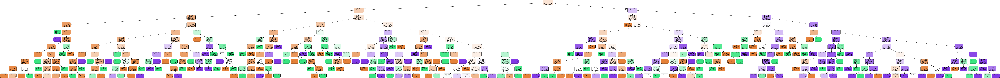

In [38]:
dot_data = StringIO()  #profundidad de solo 4 nodos
export_graphviz(my_tree_2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['improved','stable','unhealthy'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#graph.write_png('diabetes.png')
Image(graph.create_png())

@ojki
### Sin hemoglobina



## Hiperparameter search in 50 trees

This hiperparameter search is done in order to obtain the best parameters for our tree. 

In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import  GridSearchCV

# GridSearchCV
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(3,15), 'min_samples_leaf':np.arange(5,30,5)}

# Creamos un árbol de clasificación
forest=RandomForestClassifier(n_estimators=50,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True)

# Usamos gridsearch para evaluar los parámetros
forest = GridSearchCV(forest, param_grid, cv=3)


forest=forest.fit(X_train, y_train)
print(forest.best_params_)

# Entrenamos el modelo
my_model = forest.best_estimator_
my_forest=my_model.fit(X_train, y_train)




{'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 10}


According to the search, the creterion to be used is entropy, the maximum depth of the tree is 10 nodes, and the minimum samples per leaf is 10. 

In [40]:
crit = my_model.criterion
max_depth = my_model.max_depth
min_samples_leaf = my_model.min_samples_leaf

In [41]:
forest_1=RandomForestClassifier(n_estimators=1000,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True, criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf)

forest_1.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, max_features='sqrt',
                       min_samples_leaf=10, n_estimators=1000, n_jobs=-1,
                       oob_score=True, random_state=0)

In [42]:
print(forest_1.oob_score_)

0.5700992555831266


## Permutation importance

In [43]:
import eli5  ##en kaggle lo hace con test pero al hacerlo con test dan valores distintos
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(forest_1, random_state=1).fit(X_train, y_train)
eli5.show_weights(perm, feature_names = X_train.columns.tolist())

Weight,Feature
0.0995 ± 0.0186,albuminuria
0.0789 ± 0.0112,trigl
0.0692 ± 0.0092,edad
0.0372 ± 0.0061,IMC
0.0275 ± 0.0050,peso
0.0246 ± 0.0073,Epi.cist
0.0234 ± 0.0047,talla
0.0233 ± 0.0099,LDL
0.0223 ± 0.0038,TAS
0.0215 ± 0.0023,TAD


In [44]:
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.svm import SVC
from sklearn.feature_selection import SelectFromModel
# perm.feature_importances_ attribute is now available, it can be used
# for feature selection - let's e.g. select features which increase
# accuracy by at least 0.05:
sel = SelectFromModel(perm, threshold=0.05, prefit=True)
X_train2 = sel.transform(X_train)
X_test2 = sel.transform(X_test)

> Parte hecha como jorge y mery

1.0


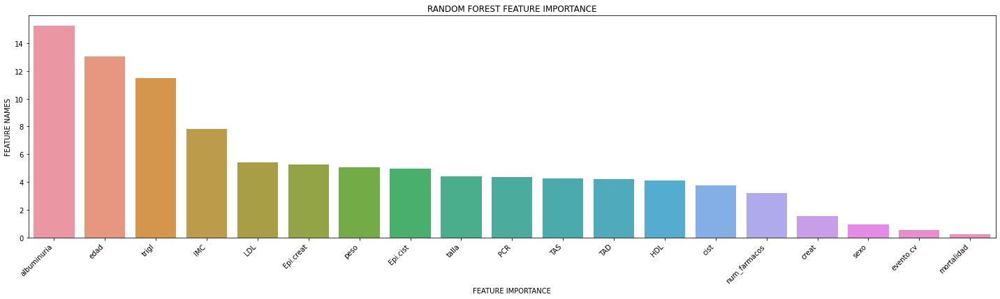

In [49]:
import seaborn as sns
#Plot feature importance
def plot_feature_importance(importance,names,model_type):

  #Create arrays from feature importance and feature names
  feature_importance = np.array(importance)
  feature_names = np.array(names)

  #Create a DataFrame using a Dictionary
  data={'feature_names':feature_names,'feature_importance':feature_importance}
  fi_df = pd.DataFrame(data)

  #Sort the DataFrame in order decreasing feature importance
  fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

  #Define size of bar plot
  fig = plt.figure(figsize=(20,6))
  #Plot Searborn bar chart
  sns.barplot(y=fi_df['feature_importance'], x=fi_df['feature_names'])
  #Add chart labels
  plt.title(model_type + 'FEATURE IMPORTANCE')
  plt.xlabel('FEATURE IMPORTANCE')
  plt.ylabel('FEATURE NAMES')
  plt.tight_layout()
  fig.autofmt_xdate(rotation=45)


plot_feature_importance(forest_1.feature_importances_*100,X_train.columns,'RANDOM FOREST ')

print(np.sum(forest_1.feature_importances_))

## Feature selection

Feature selection is done based on the permutation importance of each of the different features. 

In [59]:
#SelectFromModel
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score

scores_cv = []
thresholds = np.sort(forest_1.feature_importances_) # obtiene la importancia de cada característica
i = 0
for thresh in thresholds:
    print("{} de {}".format(i,len(thresholds)))
    selection = SelectFromModel(forest_1, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)
    # train model
    selection_model = RandomForestClassifier(n_estimators=500, n_jobs=-1,criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf,random_state=0,max_features="sqrt",oob_score=True,bootstrap=True)
    #cv estimation
    sc =cross_val_score(selection_model, select_X_train, y_train, cv=10, scoring='accuracy',n_jobs=-1)
    scores_cv.append(sc)
    i+=1

0 de 19
1 de 19
2 de 19
3 de 19
4 de 19
5 de 19
6 de 19
7 de 19
8 de 19
9 de 19
10 de 19
11 de 19
12 de 19
13 de 19
14 de 19
15 de 19
16 de 19
17 de 19
18 de 19


Text(0, 0.5, 'Accuracy')

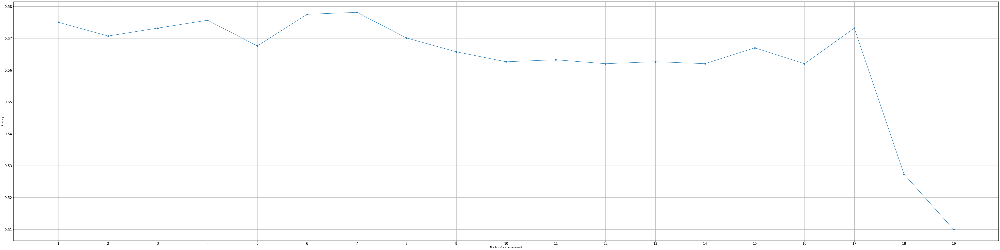

In [60]:
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.figure(figsize = (80,20))
sc_cv = np.asarray(scores_cv)
scores_m = np.mean(sc_cv,axis = 1)
scores_std = np.std(sc_cv,axis = 1)
xx = np.arange(len(scores_m))
plt.plot(xx,scores_m,'o-')
plt.grid()
_ = plt.xticks(xx,labels= np.arange(1,len(scores_m)+1))
plt.xlabel('Number of features removed')
plt.ylabel('Accuracy')



In [61]:
def rf_feat_importance(m, df):
    return pd.DataFrame({'cols':df.columns, 'imp':m.feature_importances_}
                       ).sort_values('imp', ascending=False)

#convert into a dataframe with sorted feature importances
fi = rf_feat_importance(forest_1,X_train)

#select the features
selected_features_RF = fi[:len(fi)-11]['cols'].to_list()
print("Numero de variables seleccionadas Pars:",len(selected_features_RF))
print("Selected features:",selected_features_RF)


X_train_FT = X_train[selected_features_RF]
X_test_FT = X_test[selected_features_RF]



Numero de variables seleccionadas Pars: 8
Selected features: ['albuminuria', 'edad', 'trigl', 'IMC', 'LDL', 'Epi.creat', 'peso', 'Epi.cist']


In [62]:
forest_final=RandomForestClassifier(n_estimators=1000,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True, criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf)
forest_final.fit(X_train_FT, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, max_features='sqrt',
                       min_samples_leaf=10, n_estimators=1000, n_jobs=-1,
                       oob_score=True, random_state=0)

In [63]:
print(forest_final.oob_score_) #valor mediante validación cruzada




0.5620347394540943


According to the graph, we could use up to 8 variables before the acuracy starts to dicrease. 

>

Al usar las variables nuevas sin añadir ningun hiperparametro sale una accuracy mejor. 

In [46]:
from sklearn import tree

#print(X_train.columns)

my_model_1 = tree.DecisionTreeClassifier(random_state=1)


my_tree=my_model_1.fit(X_train2, y_train)


y_pred_1 = my_tree.predict(X_test2)


# Model Accuracy, how often is the classifier correct?

print("Accuracy tree 1:",metrics.accuracy_score(y_test, y_pred_1))


Accuracy tree 1: 0.4183168316831683


In [47]:
forest_2=RandomForestClassifier(n_estimators=1000,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True, criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf)

forest_2.fit(X_train2, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, max_features='sqrt',
                       min_samples_leaf=10, n_estimators=1000, n_jobs=-1,
                       oob_score=True, random_state=0)

In [48]:
print(forest_2.oob_score_)

0.5694789081885856


In [ ]:
perm = PermutationImportance(forest_2, random_state=1).fit(X_train2, y_train)
eli5.show_weights(perm, feature_names = X_train2.columns.tolist())